In [3]:
from collections import defaultdict
from itertools import combinations

import numpy as np
import cv2 as cv
from skimage.transform import rescale
from skimage.measure import label, find_contours
from skimage.filters import gaussian
from scipy.spatial.distance import cdist
import scipy.stats as st
from skimage import morphology
from sklearn.cluster import AgglomerativeClustering
from skimage import io
from skimage.io import imread
from sklearn.cluster import DBSCAN
from sklearn.cluster import OPTICS

img = cv.imread("black_red_yellow.jpg")

def predict_image(img):
    def temp_match(img):
        #img_template = cv2.imread('/autograder/source/train/all.jpg')
        #img_template = cv.imread('all_not_clean.jpg')
        #img_template = img_template[..., ::-1]
        #temp = img_template[2370:2425,215:275]
        
        img_template = cv.imread("all.jpg")
        img_template = img_template[..., ::-1]
        temp = img_template[1192:1248,1650:1708]
        
        img2 = img.copy()
        res = cv.matchTemplate(img2,temp,5)
        img_res = np.ascontiguousarray(img, dtype=np.uint8)
        threshold = 0.49
        w, h = temp.shape[0:2]
        loc = np.where( res >= threshold)
        loc = np.stack(loc[::-1]).T
        clustering = AgglomerativeClustering(n_clusters=None, distance_threshold = 100)
        clustering.fit(loc)
        clusters = clustering.labels_

        cit = []

        for i in range(clusters.max()):
            clust = loc[clusters==i]
            clust_x = np.dstack((clust))[0][0]
            clust_y = np.dstack((clust))[0][1]
            cit.append([clust_x.mean()+20,clust_y.mean()+20])

        cit = np.dstack(cit)
        return cit


    def rgb2ycbcr(im):
        xform = np.array([[.299, .587, .114], [-.1687, -.3313, .5], [.5, -.4187, -.0813]])
        ycbcr = im.dot(xform.T)
        ycbcr[:,:,[1,2]] += 128
        return np.uint8(ycbcr)
    
    def mask(img):
        R = img[:, :, 0]              # Split attributes
        G = img[:, :, 1]
        B = img[:, :, 2]
        
        HLS = cv.cvtColor(img, cv.COLOR_RGB2HLS)
        HUE = HLS[:, :, 0]              # Split attributes
        LIGHT = HLS[:, :, 1]
        SAT = HLS[:, :, 2]
        
        imgYCrCb = rgb2ycbcr(img)
        Y = imgYCrCb[:, :, 0]              # Split attributes
        Cr = imgYCrCb[:, :, 1]
        Cb = imgYCrCb[:, :, 2]
        
        img_lab = cv.cvtColor(img, cv.COLOR_BGR2Lab)
        L = img_lab[:, :, 0]              # Split attributes
        A = img_lab[:, :, 1]
        BB = img_lab[:, :, 2]
        
        #blue
        mask_blue =  (Cr > 165) | (Cr < 154) | (B > 172)
        img2_blue = img.copy()
        mask_blue_clean = morphology.remove_small_objects(mask_blue, min_size=100, connectivity=2, in_place=False)
        mask_blue_clean = morphology.remove_small_holes(mask_blue, area_threshold=2000, connectivity=2, in_place=False)
        
        #green
        mask_green = (HUE < 75) | (HUE > 82)|(Cb>106)
        img2_green = img.copy()
        
        mask_green_clean = morphology.remove_small_objects(mask_green, min_size=30, connectivity=2, in_place=False)
        mask_green_clean = morphology.remove_small_holes(mask_green, area_threshold=2000, connectivity=2, in_place=False)
        
        
        #black
        mask_black =  (Cb<125)| (Cb>155)|(G>45)|(R>50)|(R<0)|(SAT>60)
        img2_black = img.copy()
        
        mask_black_clean = morphology.remove_small_objects(mask_black, min_size=10, connectivity=2, in_place=False)
        mask_black_clean = morphology.remove_small_holes(mask_black, area_threshold=2000, connectivity=2, in_place=False)
        
        #yellow
        mask_yellow = (BB < 103) | (BB > 107.5)|(Cr>82)
        img2_yellow = img.copy()
        
        mask_yellow_clean = morphology.remove_small_objects(mask_yellow, min_size=400, connectivity=2, in_place=False)
        mask_yellow_clean = morphology.remove_small_holes(mask_yellow, area_threshold=2000, connectivity=2, in_place=False)
        
        
        #red
        mask_red =  (Cb > 210) | (Cb < 180) | (R < 150) | (HUE < 178) 
        img2_red = img.copy()
        
        mask_red_clean = morphology.remove_small_objects(mask_red, min_size=60, connectivity=2, in_place=False)
        mask_red_clean = morphology.remove_small_holes(mask_red, area_threshold=950, connectivity=2, in_place=False)
        masks =[mask_blue_clean,mask_green_clean,mask_black_clean,mask_yellow_clean,mask_red_clean]
        return masks
    
    def plot_cont(mask_clean):
        mask_int = mask_clean.astype(np.uint8)
        contours, hierarchy = cv.findContours(mask_int, cv.RETR_TREE, cv.CHAIN_APPROX_SIMPLE)
        img_cnt = img.copy()
        return contours, hierarchy 
    
    def get_shape(approx):
        if len(approx) == 3:
            shape = "triangle"
        elif len(approx) == 4:
            
            area = cv.contourArea(approx)
            perimeter = cv.arcLength(approx, True) 
            ar = area * 16 / perimeter**2
            shape = "square" if ar >= 0.95 and ar <= 1.05 else "rectangle"
        else:
            shape = "circle"
        return shape
    
    def trains_cord(contours, hierarchy, img_cnt):
        trains = []
        for i in range(len(contours)):
            if hierarchy[0][i][-1] != 0:
                continue
            if cv.contourArea(contours[i]) < 100:
                continue
            perimeter = cv.arcLength(contours[i], True)
            approx = cv.approxPolyDP(contours[i], 0.04 * perimeter, True)
            shape = get_shape(approx)
            M = cv.moments(contours[i])
            cX = int((M["m10"] / M["m00"]))
            cY = int((M["m01"] / M["m00"]))
            pos = "x - " + str(cX) +", y - "+str(cY)
            if cX<(img_cnt.shape[1]-200):
                trains.append([cX,cY])
                if M["m00"] < 100:
                    continue
                cv.putText(img_cnt, "*", (cX, cY), cv.FONT_HERSHEY_SIMPLEX,
                    2, (255, 255, 255), 3)
        return trains   
        
    def trains(img):
        masks = mask(img)
        blue_cont = plot_cont(masks[0])
        green_cont = plot_cont(masks[1])
        black_cont = plot_cont(masks[2])
        yellow_cont = plot_cont(masks[3]) 
        red_cont = plot_cont(masks[4])
        
        img_cnt = img.copy()
        red_trains = trains_cord(red_cont[0],red_cont[1],img_cnt)
        blue_trains = trains_cord(blue_cont[0],blue_cont[1],img_cnt)
        black_trains = trains_cord(black_cont[0],black_cont[1],img_cnt)
        green_trains = trains_cord(green_cont[0],green_cont[1],img_cnt)
        yellow_trains = trains_cord(yellow_cont[0], yellow_cont[1],img_cnt)
        trains = [blue_trains,green_trains,black_trains,yellow_trains,red_trains]
        return trains

    def score(green_trains):
        if len(green_trains)>=3:
            #clustering = DBSCAN(eps=140, min_samples=2).fit(green_trains)
            #cls = clustering.labels_
            clustering = OPTICS(min_samples=2, max_eps = 160).fit(green_trains)
            cls = clustering.labels_
            
            
            values, counts = np.unique(cls, return_counts=True)
            counter = 0
            for i in counts:
                if i==1:
                    counter +=1
                elif i==2:
                    counter+=2
                elif i==3:
                    counter+=4
                elif i==4:
                    counter+=7
                elif i==6 or i==5 or i==7:
                    counter+=15
                else:
                    counter+=21
        else:
            counter=0
        return counter
    
    # raise NotImplementedError
    img = img[..., ::-1]
    trans_coord = trains(img)
    city_centers = temp_match(img)
    city_centers = np.stack(city_centers[0],axis=-1)
    city_centers = city_centers.tolist()
    n_trains = {'blue': len(trans_coord[0]), 'green': len(trans_coord[1]), 'black': len(trans_coord[2]), 'yellow': len(trans_coord[3]), 'red': len(trans_coord[4])}
    scores = {'blue': score(trans_coord[0]), 'green': score(trans_coord[1]), 'black': score(trans_coord[2]), 'yellow': score(trans_coord[3]), 'red': score(trans_coord[4])}
    return city_centers, n_trains, scores


therea are 26 trains
therea are 1 trains
therea are 33 trains
therea are 0 trains
therea are 20 trains
Wall time: 20.8 s


([[3396.5172413793102, 2415.551724137931],
  [3094.92, 2204.6],
  [1227.6666666666667, 845.1666666666666],
  [3688.6785714285716, 709.8214285714286],
  [3355.9310344827586, 807.2758620689655],
  [2119.4375, 2108.28125],
  [132.20833333333331, 2322.2083333333335],
  [3798.8260869565215, 1493.7391304347825],
  [609.5625, 268.46875],
  [1478.7083333333333, 1141.5833333333333],
  [3779.2727272727275, 1841.1818181818182],
  [2957.75, 794.2142857142857],
  [2527.625, 894.4375],
  [3310.0625, 251.9375],
  [1144.2666666666667, 1022.8],
  [2892.4285714285716, 1726.5714285714287],
  [2127.875, 1368.125],
  [482.77777777777777, 1283.2962962962963],
  [2340.8, 631.0666666666667],
  [862.9130434782609, 832.695652173913],
  [2658.0, 1967.5],
  [2311.375, 1462.1875],
  [3111.9285714285716, 1092.2857142857142],
  [1697.7916666666667, 1305.6666666666667],
  [2927.8, 2509.5],
  [1343.7857142857142, 1900.642857142857],
  [1446.0, 1546.5],
  [1791.5714285714287, 2009.2857142857142],
  [3433.2, 1784.4],
  

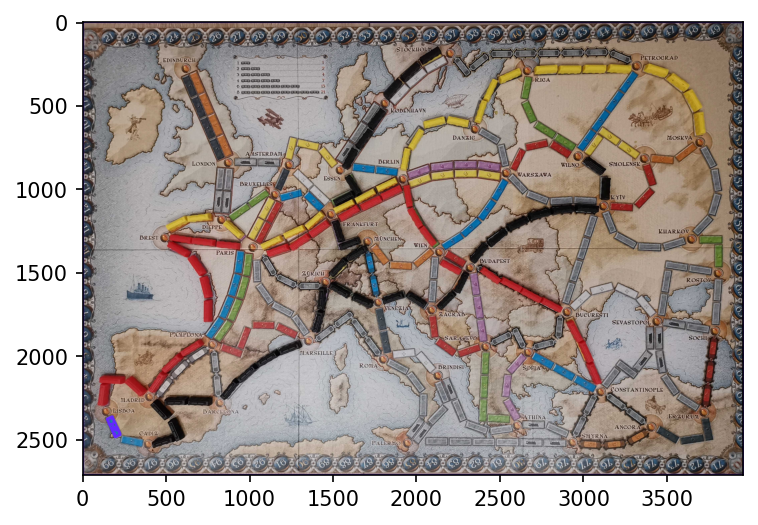

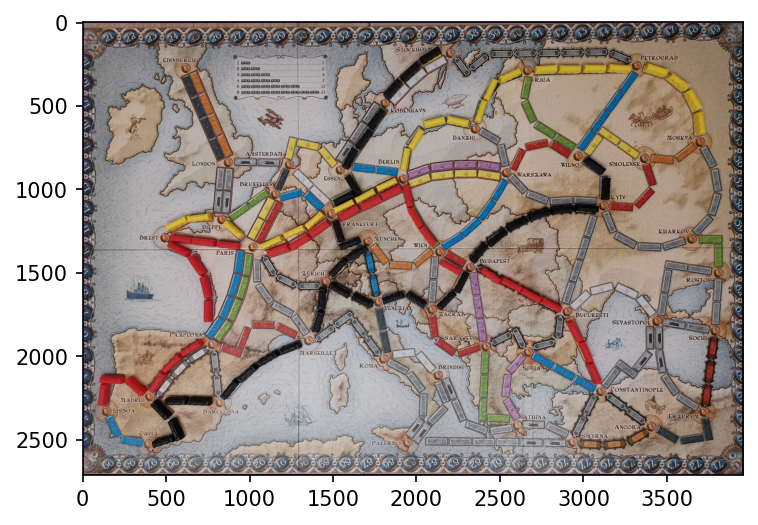

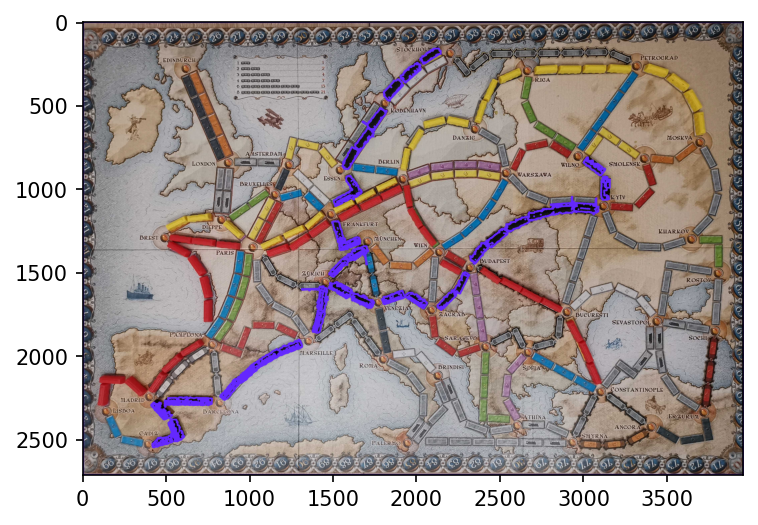

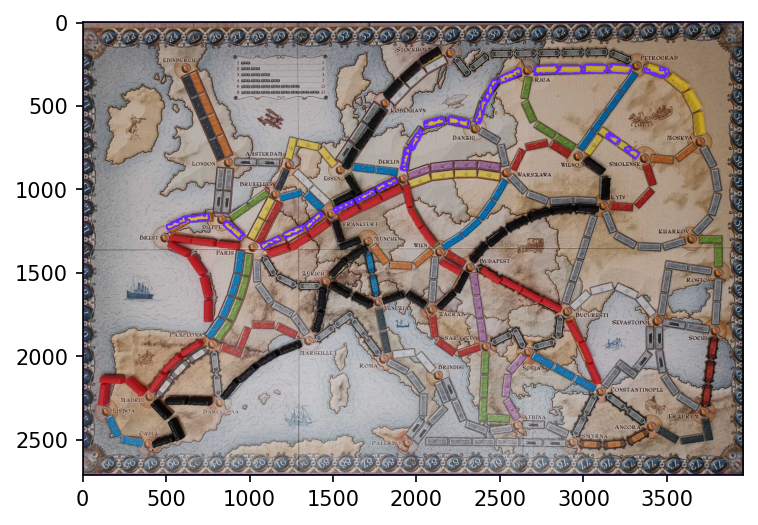

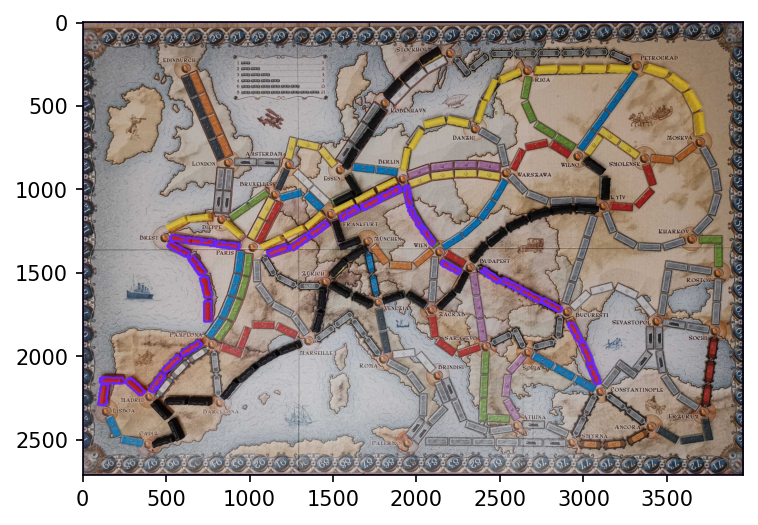

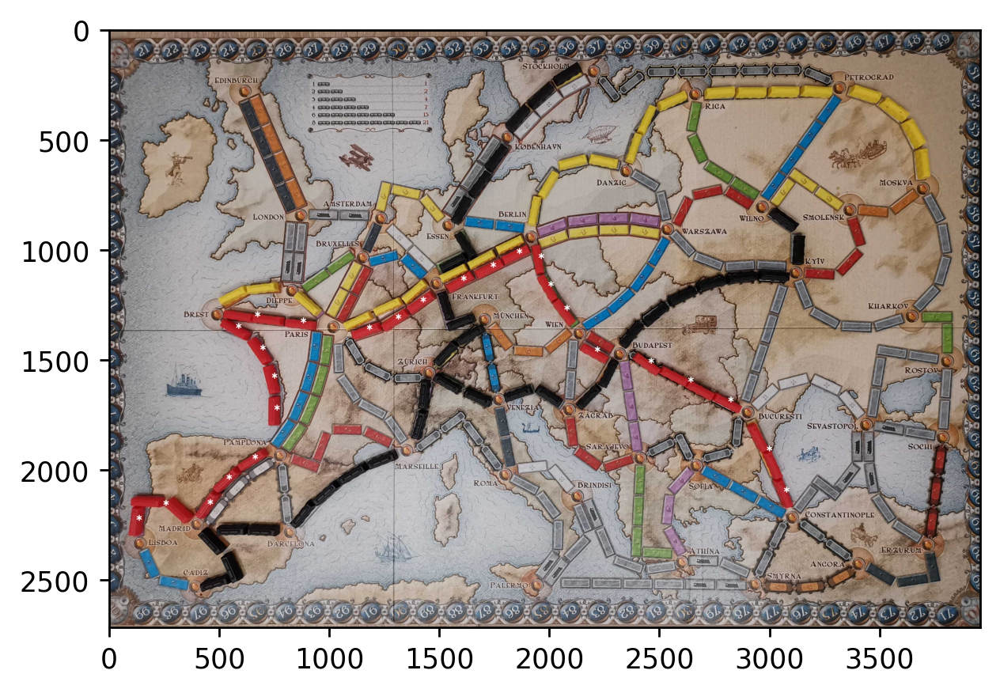

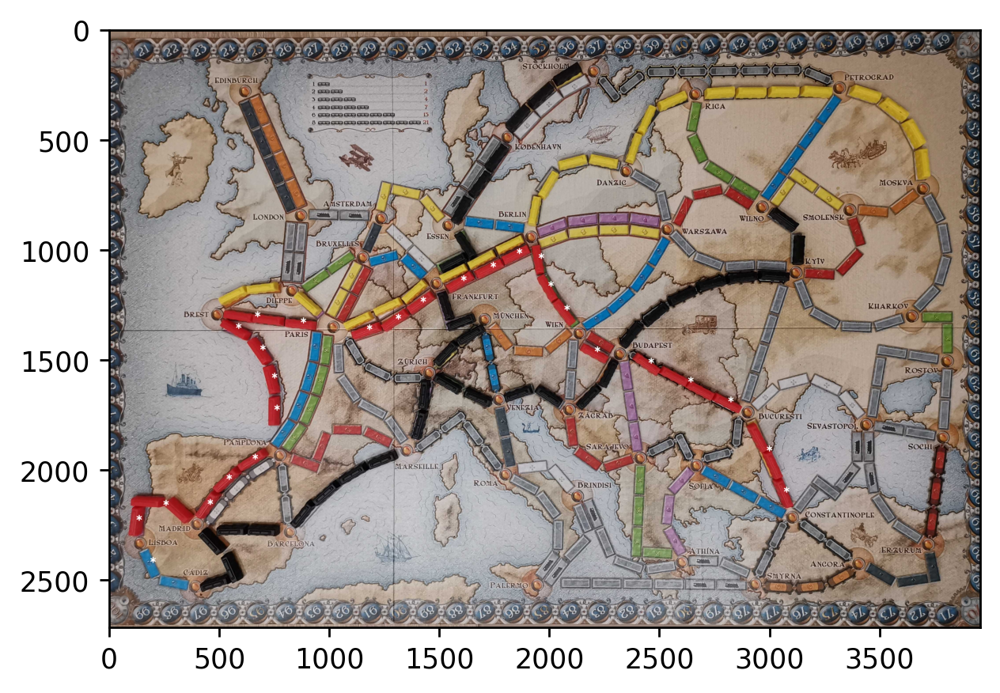

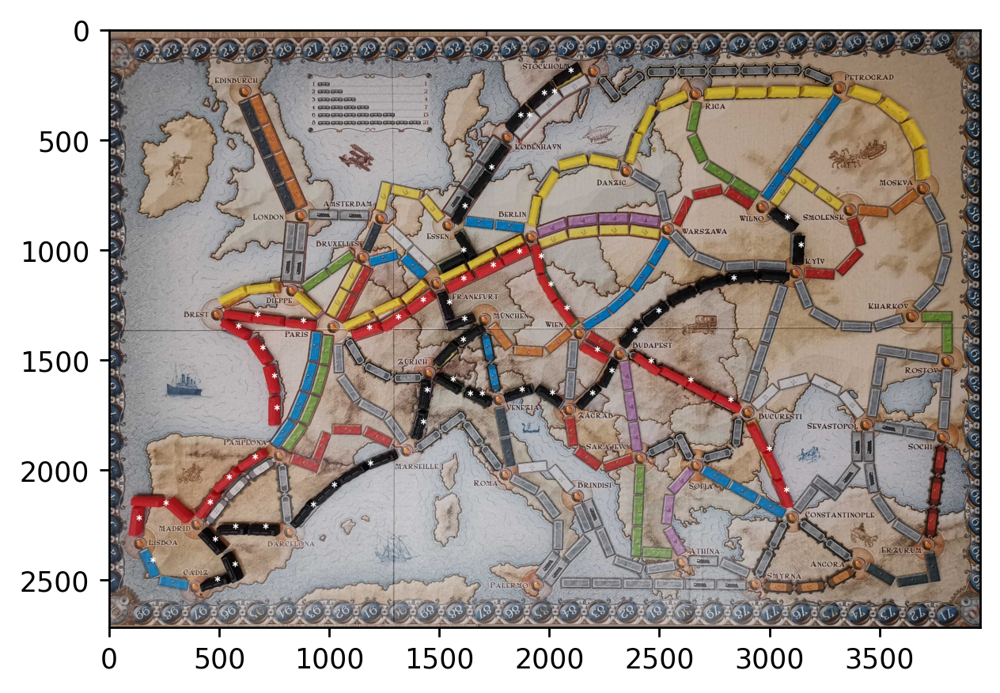

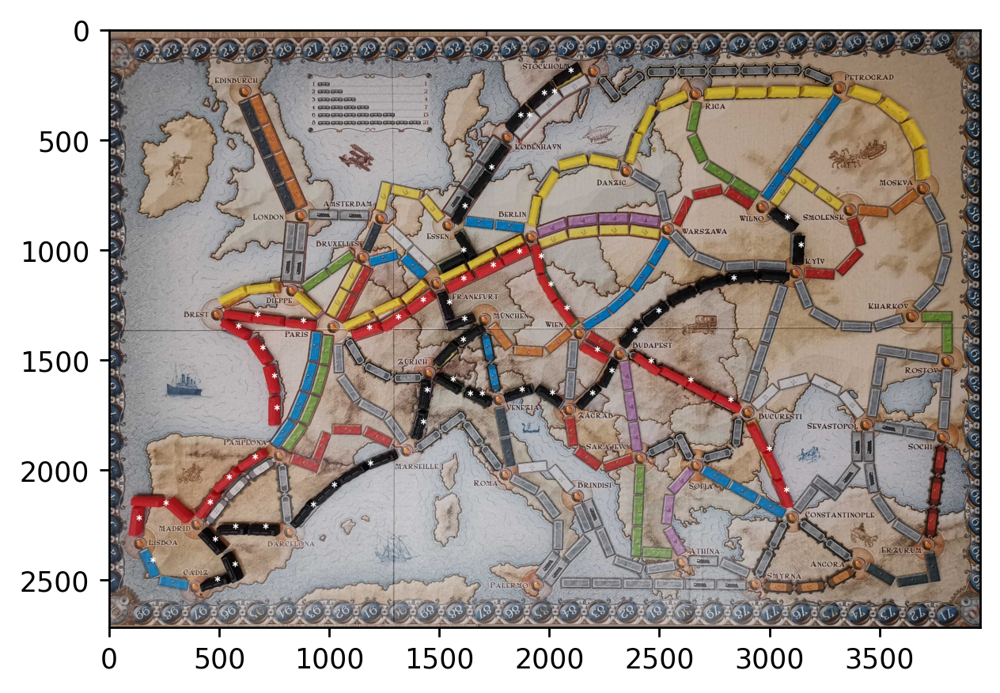

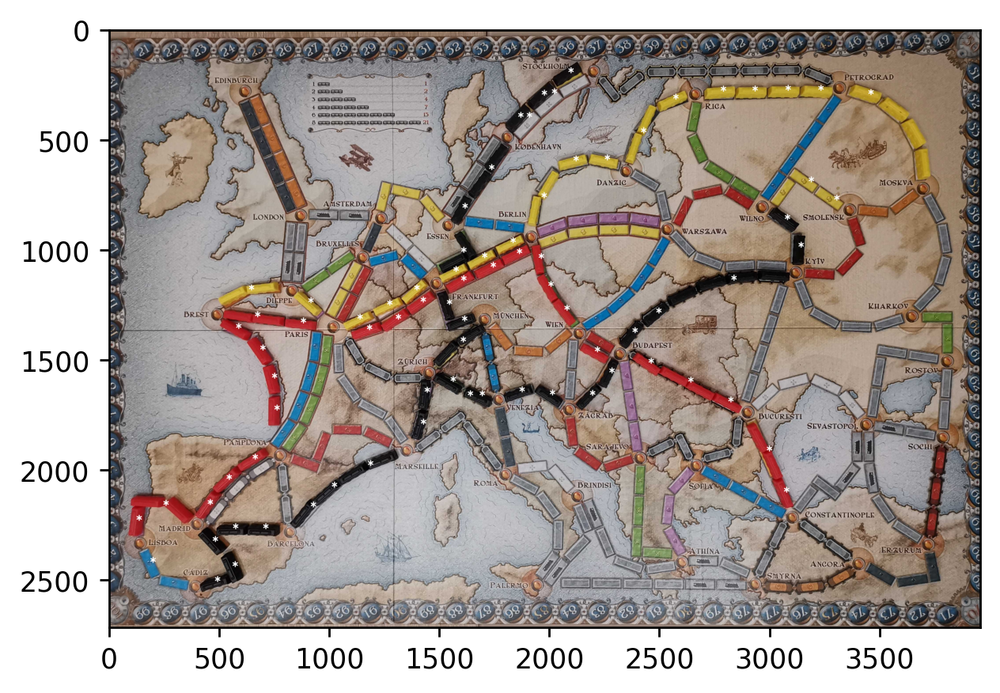

In [4]:
%%time
predict_image(img)

In [35]:
np.stack(city_centers[0],axis=-1)

array([[ 130.46666667, 2323.41333333],
       [3686.3125    ,  710.22916667],
       [ 607.37704918,  268.04918033],
       [3795.30434783, 1493.95652174],
       [3306.04761905,  252.64285714],
       [3776.46875   , 1840.75      ],
       [2118.45652174, 2108.45652174],
       [3353.46      ,  807.26      ],
       [2955.15625   ,  794.46875   ],
       [ 861.06818182,  832.06818182],
       [2526.30434783,  894.2173913 ],
       [2191.16666667,  177.16666667],
       [3394.18518519, 2414.96296296],
       [2890.61538462, 1726.        ],
       [1008.5       , 1339.71428571],
       [2339.43589744,  631.30769231],
       [3091.6       , 2204.2       ],
       [ 480.84375   , 1283.375     ],
       [1226.32432432,  845.05405405],
       [ 820.93333333, 1173.4       ],
       [1696.42857143, 1305.23809524],
       [2650.9       ,  280.3       ],
       [3707.21428571, 2326.71428571],
       [1790.52941176, 2008.82352941],
       [3426.25      , 1782.58333333],
       [1342.61904762, 19

In [34]:
city_centers

array([[[ 130.46666667, 3686.3125    ,  607.37704918, 3795.30434783,
         3306.04761905, 3776.46875   , 2118.45652174, 3353.46      ,
         2955.15625   ,  861.06818182, 2526.30434783, 2191.16666667,
         3394.18518519, 2890.61538462, 1008.5       , 2339.43589744,
         3091.6       ,  480.84375   , 1226.32432432,  820.93333333,
         1696.42857143, 2650.9       , 3707.21428571, 1790.52941176,
         3426.25      , 1342.61904762, 1477.36666667, 3110.90909091,
         3633.23076923, 1907.5       , 2125.8       , 3221.        ,
         2309.        ],
        [2323.41333333,  710.22916667,  268.04918033, 1493.95652174,
          252.64285714, 1840.75      , 2108.45652174,  807.26      ,
          794.46875   ,  832.06818182,  894.2173913 ,  177.16666667,
         2414.96296296, 1726.        , 1339.71428571,  631.30769231,
         2204.2       , 1283.375     ,  845.05405405, 1173.4       ,
         1305.23809524,  280.3       , 2326.71428571, 2008.82352941,
         